In [5]:
import pandas as pd

data_dir = r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded"

files = {
    "bike_routes": f"{data_dir}\\bike-routes.xlsx",
    "parks_rec": f"{data_dir}\\cary-parks-and-recreation-areas.xlsx",
    "eco_counters": f"{data_dir}\\eco-counter-sites.xlsx",
    "points_of_interest": f"{data_dir}\\points-of-interest.xlsx"
}

dfs = {name: pd.read_excel(path) for name, path in files.items()}

for name, df in dfs.items():
    print(f"--- {name} ---")
    print(f"Shape: {df.shape}")
    print("Columns:", df.columns.tolist())
    print(df.head(3))


--- bike_routes ---
Shape: (250, 9)
Columns: ['Route Type', 'Facilty Type', 'Status', 'Speed Limit in Miles per Hour', 'App Bike Route', 'Bike Route Number', 'Shape.STLength()', 'Geo Shape', 'Geo Point']
           Route Type        Facilty Type    Status  \
0  Neighborhood Route  Striped Bike Lanes  Existing   
1  Neighborhood Route  Striped Bike Lanes  Existing   
2  Neighborhood Route                 NaN  Existing   

   Speed Limit in Miles per Hour             App Bike Route  \
0                           25.0                  Bike Lane   
1                           30.0                  Bike Lane   
2                           25.0  Signed Neighborhood Route   

   Bike Route Number  Shape.STLength()  \
0                NaN       2026.479957   
1                NaN       2078.993251   
2                NaN       1544.352640   

                                           Geo Shape  \
0  {"coordinates":[[-78.79182267800121,35.8179492...   
1  {"coordinates":[[-78.84858497096151,35

In [6]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium

In [7]:
import ast

# Helper: Parse 'lat, lon' or 'lon, lat' columns as tuple of floats
def parse_geo_point(s, reverse=False):
    try:
        parts = [float(x.strip()) for x in s.split(",")]
        return (parts[1], parts[0]) if reverse else (parts[0], parts[1])
    except Exception:
        return (None, None)

# Parse Geo Point columns
dfs['bike_routes']['lat'], dfs['bike_routes']['lon'] = zip(*dfs['bike_routes']['Geo Point'].map(parse_geo_point))
dfs['parks_rec']['lat'], dfs['parks_rec']['lon'] = zip(*dfs['parks_rec']['geo_point_2d'].map(parse_geo_point))
dfs['points_of_interest']['lat'], dfs['points_of_interest']['lon'] = zip(*dfs['points_of_interest']['geo_point_2d'].map(parse_geo_point))
dfs['eco_counters']['lat'], dfs['eco_counters']['lon'] = zip(*dfs['eco_counters']['Coordinates'].map(parse_geo_point))

for name, df in dfs.items():
    print(f"{name} lat/lon sample")
    print(df[['lat', 'lon']].head(3))


bike_routes lat/lon sample
         lat        lon
0  35.815475 -78.793139
1  35.803856 -78.851786
2  35.811816 -78.780498
parks_rec lat/lon sample
         lat        lon
0  35.800107 -78.851643
1  35.800290 -78.851986
2  35.800262 -78.853780
eco_counters lat/lon sample
         lat        lon
0  35.816770 -78.927670
1  35.972176 -78.515607
2  35.731424 -78.851160
points_of_interest lat/lon sample
         lat        lon
0  35.779899 -78.766192
1  35.812806 -78.768534
2  35.758857 -78.826827


In [8]:
# Route Segment Summary Table
route_summary = dfs['bike_routes'][[
    'Route Type',
    'Facilty Type',
    'Status',
    'Speed Limit in Miles per Hour',
    'App Bike Route',
    'Shape.STLength()',
    'lat',
    'lon'
]].copy()

# Explore unique route attributes for scoring
print("Distinct Route Types:", route_summary['Route Type'].unique())
print("Distinct Facility Types:", route_summary['Facilty Type'].unique())
print("Distinct Status Values:", route_summary['Status'].unique())

# Count unique assets for coverage analysis
num_parks = dfs['parks_rec'].shape[0]
num_counters = dfs['eco_counters'].shape[0]
num_pois = dfs['points_of_interest'].shape[0]

print("Num Bike Routes:", route_summary.shape[0])
print("Num Parks:", num_parks)
print("Num Eco Counters:", num_counters)
print("Num Points of Interest:", num_pois)

print(route_summary.head(3))


Distinct Route Types: ['Neighborhood Route' 'Cary Commuter Route' 'NC Route' 'US Route' nan]
Distinct Facility Types: ['Striped Bike Lanes' nan 'Wide Outside Lanes'
 'Shared Lane Markings/Sharrows'
 'Protected Bike Lanes/Separated Bike Lanes']
Distinct Status Values: ['Existing' 'Proposed' nan]
Num Bike Routes: 250
Num Parks: 867
Num Eco Counters: 40
Num Points of Interest: 70
           Route Type        Facilty Type    Status  \
0  Neighborhood Route  Striped Bike Lanes  Existing   
1  Neighborhood Route  Striped Bike Lanes  Existing   
2  Neighborhood Route                 NaN  Existing   

   Speed Limit in Miles per Hour             App Bike Route  Shape.STLength()  \
0                           25.0                  Bike Lane       2026.479957   
1                           30.0                  Bike Lane       2078.993251   
2                           25.0  Signed Neighborhood Route       1544.352640   

         lat        lon  
0  35.815475 -78.793139  
1  35.803856 -78.85178

In [9]:
import numpy as np

# Haversine formula: returns distance in miles
def haversine_miles(lat1, lon1, lat2, lon2):
    R = 3958.8  # Radius of earth (miles)
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat, dlon = lat2-lat1, lon2-lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2)**2
    return R * 2 * np.arcsin(np.sqrt(a))

def min_distance_miles(point, asset_array):
    return np.min([haversine_miles(point[0], point[1], asset[0], asset[1]) for asset in asset_array])

# Build asset arrays for proximity computation
parks_latlon = dfs['parks_rec'][['lat', 'lon']].values
counters_latlon = dfs['eco_counters'][['lat', 'lon']].values
pois_latlon = dfs['points_of_interest'][['lat', 'lon']].values

# Compute proximity
route_summary['dist_to_park_miles'] = [min_distance_miles((row['lat'], row['lon']), parks_latlon) for _, row in route_summary.iterrows()]
route_summary['dist_to_counter_miles'] = [min_distance_miles((row['lat'], row['lon']), counters_latlon) for _, row in route_summary.iterrows()]
route_summary['dist_to_poi_miles'] = [min_distance_miles((row['lat'], row['lon']), pois_latlon) for _, row in route_summary.iterrows()]

print(route_summary[['lat', 'lon', 'dist_to_park_miles', 'dist_to_counter_miles', 'dist_to_poi_miles']].head(3))


         lat        lon  dist_to_park_miles  dist_to_counter_miles  \
0  35.815475 -78.793139                 NaN               1.266350   
1  35.803856 -78.851786                 NaN               0.562672   
2  35.811816 -78.780498                 NaN               1.494424   

   dist_to_poi_miles  
0           0.902696  
1           0.467478  
2           0.670653  


In [10]:
# Remove parks with missing coordinates from asset array
clean_parks = dfs['parks_rec'][dfs['parks_rec']['lat'].notna() & dfs['parks_rec']['lon'].notna()]
parks_latlon = clean_parks[['lat', 'lon']].values

# Recalculate park distances with cleaned asset array
route_summary['dist_to_park_miles'] = [
    min_distance_miles((row['lat'], row['lon']), parks_latlon)
    if parks_latlon.size > 0 else np.nan
    for _, row in route_summary.iterrows()
]

print(route_summary[['lat', 'lon', 'dist_to_park_miles']].head(10))


         lat        lon  dist_to_park_miles
0  35.815475 -78.793139            0.237657
1  35.803856 -78.851786            0.241601
2  35.811816 -78.780498            0.120806
3  35.826960 -78.768659            0.482969
4  35.796253 -78.828460            0.526043
5  35.806301 -78.785449            0.133243
6  35.800571 -78.859654            0.143114
7  35.810886 -78.779965            0.147920
8  35.763603 -78.766680            0.201743
9  35.820279 -78.780188            0.291040


In [11]:
# Infrastructure/facility type score (Protected > Striped > Shared > None/NaN)
facility_score_map = {
    'Protected Bike Lanes/Separated Bike Lanes': 3,
    'Striped Bike Lanes': 2,
    'Wide Outside Lanes': 1,
    'Shared Lane Markings/Sharrows': 1,
    None: 0,
    np.nan: 0
}

# Status score
status_score_map = {
    'Existing': 1,
    'Proposed': 0.5,
    None: 0,
    np.nan: 0
}

# Speed limit score
def speed_score(speed):
    if pd.isnull(speed):
        return 0
    if speed <= 25:
        return 3
    elif speed <= 30:
        return 2
    elif speed <= 35:
        return 1
    else:
        return 0

# Connectivity score by proximity (per segment; best if near multiple assets)
def proximity_score(dist):
    if pd.isnull(dist):
        return 0
    if dist <= 0.25:
        return 3
    elif dist <= 0.5:
        return 2
    elif dist <= 1.0:
        return 1
    else:
        return 0

# Compute scores
route_summary['facility_score'] = route_summary['Facilty Type'].map(facility_score_map).fillna(0)
route_summary['status_score'] = route_summary['Status'].map(status_score_map).fillna(0)
route_summary['speed_score'] = route_summary['Speed Limit in Miles per Hour'].apply(speed_score)
route_summary['park_score'] = route_summary['dist_to_park_miles'].apply(proximity_score)
route_summary['counter_score'] = route_summary['dist_to_counter_miles'].apply(proximity_score)
route_summary['poi_score'] = route_summary['dist_to_poi_miles'].apply(proximity_score)

# Composite network score (max = 3+1+3+3+3+3 = 16. Normalize to 0–10 if needed)
route_summary['segment_score'] = (
    route_summary['facility_score'] +
    route_summary['status_score'] +
    route_summary['speed_score'] +
    route_summary['park_score'] +
    route_summary['counter_score'] +
    route_summary['poi_score']
)

# Optional: Normalize score for mapping
route_summary['segment_score_norm10'] = (route_summary['segment_score'] / route_summary['segment_score'].max()) * 10

# Show first 5 segments with score components and total
cols = [
    'Route Type', 'Facilty Type', 'Status', 'Speed Limit in Miles per Hour',
    'facility_score', 'status_score', 'speed_score',
    'park_score', 'counter_score', 'poi_score',
    'segment_score', 'segment_score_norm10'
]
print(route_summary[cols].head(5))


            Route Type        Facilty Type    Status  \
0   Neighborhood Route  Striped Bike Lanes  Existing   
1   Neighborhood Route  Striped Bike Lanes  Existing   
2   Neighborhood Route                 NaN  Existing   
3  Cary Commuter Route  Wide Outside Lanes  Existing   
4   Neighborhood Route  Striped Bike Lanes  Existing   

   Speed Limit in Miles per Hour  facility_score  status_score  speed_score  \
0                           25.0               2           1.0            3   
1                           30.0               2           1.0            2   
2                           25.0               0           1.0            3   
3                           45.0               1           1.0            0   
4                           25.0               2           1.0            3   

   park_score  counter_score  poi_score  segment_score  segment_score_norm10  
0           3              0          1           10.0              7.142857  
1           3              1  

In [12]:
# Use OpenStreetMap tiles for traffic style, no satellite
colormap = cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=10), cmap=cm.get_cmap('RdYlGn'))

# Create base map with OpenStreetMap tiles (traffic layer, not satellite)
m = folium.Map(location=[35.78, -78.8], zoom_start=12, tiles='OpenStreetMap', control_scale=True)

for _, row in route_summary.iterrows():
    color = colors.rgb2hex(colormap.to_rgba(row['segment_score_norm10']))
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        color=color,
        fill=True,
        fill_opacity=0.8,
        popup=f"Score: {row['segment_score_norm10']:.1f}\nType: {row['Facilty Type']}",
    ).add_to(m)

from branca.colormap import LinearColormap
linear = LinearColormap(
    ['red', 'yellow', 'green'],
    vmin=0, vmax=10,
    caption='Bike Segment Score (normalized)'
)
m.add_child(linear)

m  #  clear traffic/road map, not satellite

C:\Users\hp\AppData\Local\Temp\ipykernel_32712\457469494.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=10), cmap=cm.get_cmap('RdYlGn'))


In [13]:
route_summary = route_summary.copy()
route_summary['Geo Shape'] = dfs['bike_routes']['Geo Shape']


C:\Users\hp\AppData\Local\Temp\ipykernel_32712\2783445590.py:44: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



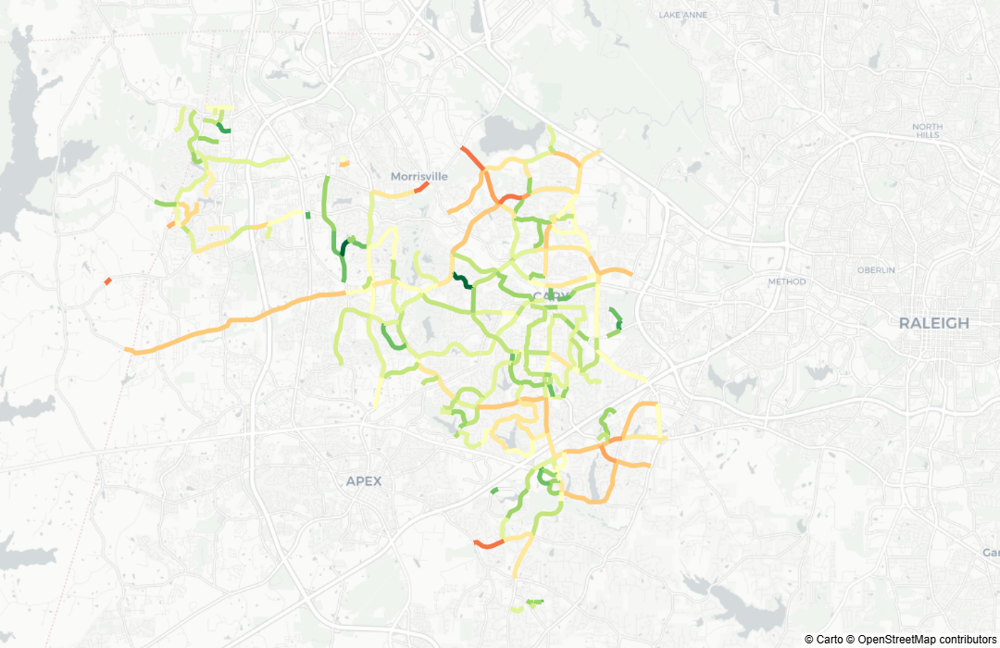

In [14]:
import plotly.graph_objs as go
import ast
from matplotlib import cm

def rgba_to_hex(rgba):
    r, g, b, a = [int(255*x) if i < 3 else x for i, x in enumerate(rgba)]
    return '#{:02x}{:02x}{:02x}'.format(r, g, b)

# Attach 'Geo Shape' as before
route_summary = route_summary.copy()
route_summary['Geo Shape'] = dfs['bike_routes']['Geo Shape']

fig = go.Figure()


def extract_line_coords(geoshape):
    try:
        obj = ast.literal_eval(geoshape)
        coords = obj['coordinates']
        # Handle nested structures (LineString/Polygon/other)
        if isinstance(coords[0], list) and isinstance(coords[0][0], float):
            return coords
        if isinstance(coords[0], list):
            return coords[0]
        return coords
    except Exception:
        return []


for idx, row in route_summary.iterrows():
    coords = extract_line_coords(row['Geo Shape'])
    if not coords or len(coords) < 2:
        continue
    lats, lons = zip(*[(c[1], c[0]) for c in coords])
    color_val = row['segment_score_norm10']
    rgba = cm.RdYlGn(color_val/10)
    hex_color = rgba_to_hex(rgba)
    hover_text = (
        f"Score: {color_val:.1f}<br>"
        f"Facility: {row['Facilty Type']}<br>"
        f"Status: {row['Status']}<br>"
        f"Speed Limit: {row['Speed Limit in Miles per Hour']} mph"
    )
    fig.add_trace(go.Scattermapbox(
        lat=lats,
        lon=lons,
        mode='lines',
        line=dict(
            width=5,
            color=hex_color
        ),
        name=f"Segment {idx+1}",
        hoverinfo='text',
        text=[hover_text]*len(lats),  # Shows the same tooltip anywhere you hover on the line
    ))

fig.update_layout(
    mapbox=dict(
        style="carto-positron",
        zoom=11,
        center=dict(lat=35.78, lon=-78.8)
    ),
    height=700,
    margin={"r":0,"t":0,"l":0,"b":0},
    showlegend=False
)
fig.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_32712\1784039719.py:2: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

C:\Users\hp\AppData\Local\Temp\ipykernel_32712\1784039719.py:18: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

C:\Users\hp\AppData\Local\Temp\ipykernel_32712\1784039719.py:34: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



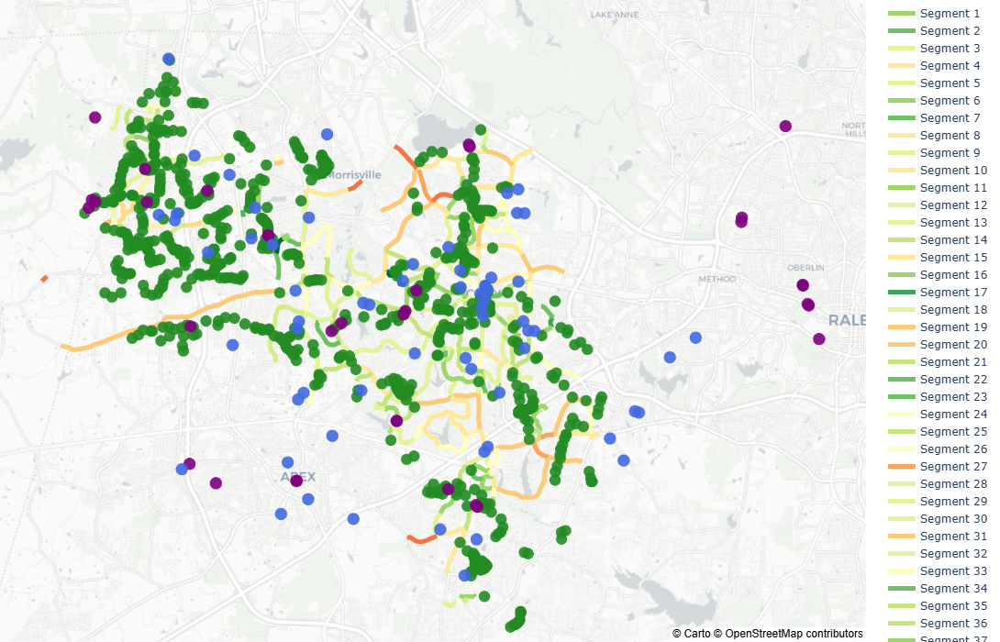

In [15]:
# Parks: green circles
fig.add_trace(go.Scattermapbox(
    lat=dfs['parks_rec']['lat'],
    lon=dfs['parks_rec']['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        symbol='circle',
        size=13,
        color='forestgreen',
        opacity=0.9,
    ),
    name='Parks',
    text=dfs['parks_rec']['Name'],
    hoverinfo='text'
))

# Eco counters: purple circles
fig.add_trace(go.Scattermapbox(
    lat=dfs['eco_counters']['lat'],
    lon=dfs['eco_counters']['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        symbol='circle',
        size=14,
        color='purple',
        opacity=0.9,
    ),
    name='Eco Counters',
    text=dfs['eco_counters']['Name'],
    hoverinfo='text'
))

# POIs: blue circles
fig.add_trace(go.Scattermapbox(
    lat=dfs['points_of_interest']['lat'],
    lon=dfs['points_of_interest']['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        symbol='circle',
        size=14,
        color='royalblue',
        opacity=0.9,
    ),
    name='POIs',
    text=dfs['points_of_interest']['Name of Facility'],
    hoverinfo='text'
))

fig.update_layout(showlegend=True)
fig.show()


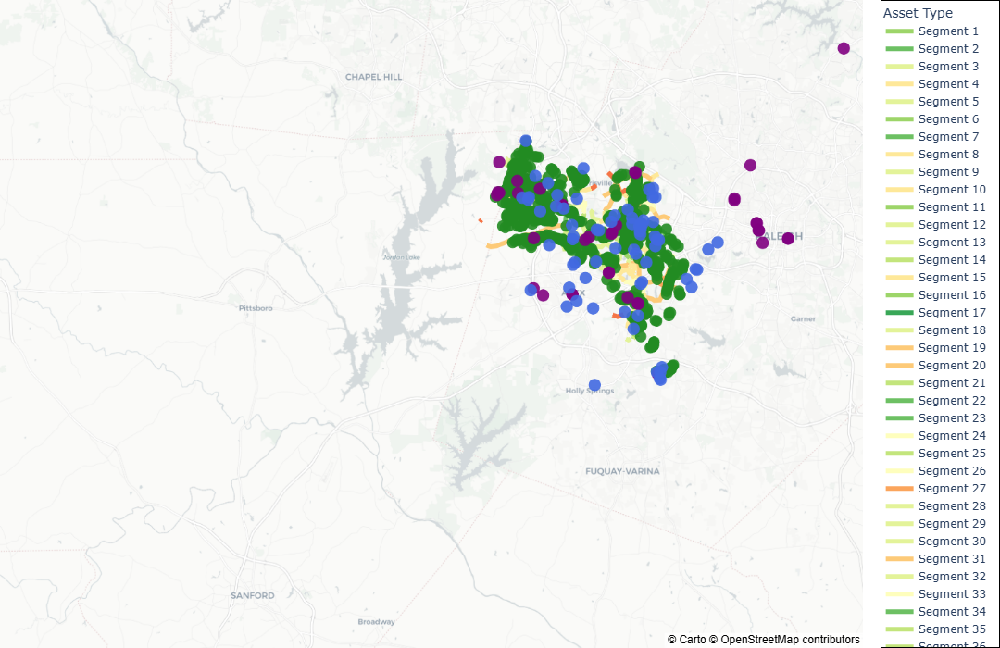

In [16]:
# Add legend to enable display filtering interactively
fig.update_layout(
    showlegend=True,
    legend=dict(
        title="Asset Type",
        bgcolor="white",
        bordercolor="black",
        borderwidth=1,
        font=dict(size=12),
        itemsizing='constant',
    )
)


C:\Users\hp\AppData\Local\Temp\ipykernel_32712\1201333681.py:1: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



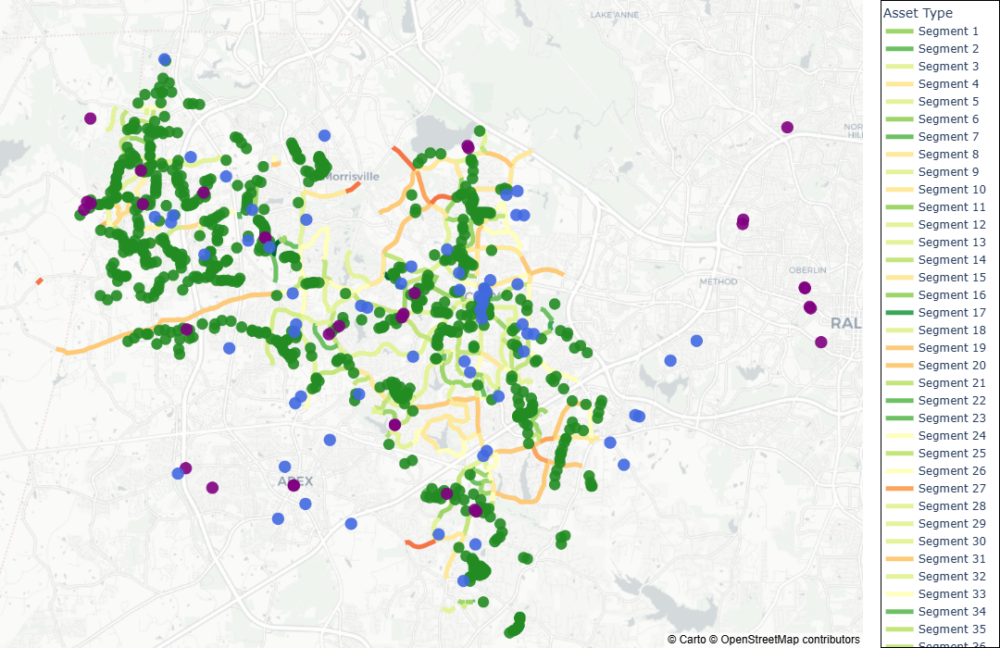

In [17]:
fig.add_trace(go.Scattermapbox(
    lat=dfs['points_of_interest']['lat'],
    lon=dfs['points_of_interest']['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        symbol='circle',
        size=14,
        color='royalblue',
        opacity=0.9,
    ),
    name='POIs',
    text=dfs['points_of_interest']['Name of Facility'],
    hoverinfo='text',
    visible='legendonly' 
))


In [18]:
###########################################################################################

In [19]:
###########################################################################################

In [20]:
###########################################################################################

In [21]:
data_dir = r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded"

# File paths
crash_file = f"{data_dir}\\annual_37_183_0021_2017.xlsx"
age_file = f"{data_dir}\\census-age-range-in-cary0.xlsx"
race_file = f"{data_dir}\\census-race-distribution-in-cary.xlsx"

# Load crash/environment file
crash_df = pd.read_excel(crash_file)
print("Crash/environment data:")
print(crash_df.shape)
print(crash_df.columns)
print(crash_df.head(3))

# Load demographic files
age_df = pd.read_excel(age_file)
print("\nAge distribution data:")
print(age_df.shape)
print(age_df.columns)
print(age_df.head(3))

race_df = pd.read_excel(race_file)
print("\nRace distribution data:")
print(race_df.shape)
print(race_df.columns)
print(race_df.head(3))

Crash/environment data:
(1258, 52)
Index(['State Code', 'County Code', 'Site Number', 'Parameter Code', 'POC',
       'Latitude', 'Longitude', 'Datum', 'Parameter Name',
       'Duration Description', 'Pollutant Standard', 'Year',
       'Units of Measure', 'Exceptional Data Type', 'Observation Count',
       'Observation Percent', 'Primary Exceedance Count',
       'Secondary Exceedance Count', 'Valid Day Count', 'Required Day Count',
       'Exceptional Data Count', 'Certification Indicator', 'Null Data Count',
       'Half MDL Sub Count', 'Arithmetic Mean', 'Arithmetic Standard Dev',
       'Weighted Arithmetic Mean', 'Minimum Value', 'First Maximum Value',
       'First Maximum DateTime', 'Second Maximum Value',
       'Second Maximum DateTime', 'Third Maximum Value',
       'Third Maximum DateTime', 'Fourth Maximum Value',
       'Fourth Maximum DateTime', '50th Percentile', '75th Percentile',
       '90th Percentile', '95th Percentile', '98th Percentile',
       '99th Percentile'

In [25]:
# Find target variables
print("Crash dataset columns with 'sever', 'injur', 'fatal', or 'exceed':")
for col in crash_df.columns:
    if any(key in col.lower() for key in ['sever', 'injur', 'fatal', 'exceed']):
        print(col)

# checking relevant columns/unique values
for feature in [
    'Primary Exceedance Count',
    'Secondary Exceedance Count',
    'First Maximum Value',
    'Exceptional Data Type',
    'Observation Count',
    'Pollutant Standard',  # See if 'crash' or pollutant type predicts risk zones
    'Parameter Name',
    'Year',
    'Arithmetic Mean'
]:
    if feature in crash_df.columns:
        print(f"\n{feature}:")
        print(crash_df[feature].value_counts(dropna=False).head(10))
# printing columns to inspect visually
print("\nSample row (all columns):")
print(crash_df.iloc[0])


Crash dataset columns with 'sever', 'injur', 'fatal', or 'exceed':
Primary Exceedance Count
Secondary Exceedance Count

Primary Exceedance Count:
Primary Exceedance Count
NaN    1180
0.0      76
1.0       2
Name: count, dtype: int64

Secondary Exceedance Count:
Secondary Exceedance Count
NaN    1192
0.0      64
1.0       2
Name: count, dtype: int64

First Maximum Value:
First Maximum Value
1     105
3      55
0      54
2      45
7      33
5      32
8      32
6      29
4      25
13     18
Name: count, dtype: int64

Exceptional Data Type:
Exceptional Data Type
No Events           1008
Events Inclucded     250
Name: count, dtype: int64

Observation Count:
Observation Count
119    104
118     86
71      75
57      60
44      46
115     39
52      31
120     30
45      30
117     29
Name: count, dtype: int64

Pollutant Standard:
Pollutant Standard
NaN                  1143
PM25 Annual 2012       20
PM25 24-hour 2012      20
NO2 Annual 1971        12
NO2 1-hour 2010        12
CO 8-hour 1971 

In [22]:
# NaN summary for all relevant fields
severity_nan = crash_df['Exceptional Data Type'].isna().sum()
primary_nan = crash_df['Primary Exceedance Count'].isna().sum()
secondary_nan = crash_df['Secondary Exceedance Count'].isna().sum()

# Count NaNs in all columns
nan_per_column = crash_df.isna().sum().sort_values(ascending=False)
print("NaN count per column (top 15 columns):\n", nan_per_column.head(15))

# Inspect a few rows where severity (Exceptional Data Type) is NaN
print("\nRows where severity is NaN:")
print(crash_df[crash_df['Exceptional Data Type'].isna()].head(5))

# For severity-related NaNs, see which Parameter Names/pollutant or years they appear in:
if severity_nan > 0:
    print("\nParameter Names for NaN severity rows:")
    print(crash_df[crash_df['Exceptional Data Type'].isna()]['Parameter Name'].value_counts())

    print("\nYears for NaN severity rows:")
    print(crash_df[crash_df['Exceptional Data Type'].isna()]['Year'].value_counts())

# Percentage NaNs
print("\nPercentage NaN in Exceptional Data Type:", round(100*severity_nan/len(crash_df), 2), "%")
print("Total crash records:", len(crash_df))


NaN count per column (top 15 columns):
 Tribe Name                    1258
Weighted Arithmetic Mean      1209
Secondary Exceedance Count    1192
Primary Exceedance Count      1180
Pollutant Standard            1143
City Name                       60
Third Maximum Value              5
Third Maximum DateTime           5
Fourth Maximum Value             5
Fourth Maximum DateTime          5
Second Maximum Value             4
Second Maximum DateTime          4
90th Percentile                  0
50th Percentile                  0
75th Percentile                  0
dtype: int64

Rows where severity is NaN:
Empty DataFrame
Columns: [State Code, County Code, Site Number, Parameter Code, POC, Latitude, Longitude, Datum, Parameter Name, Duration Description, Pollutant Standard, Year, Units of Measure, Exceptional Data Type, Observation Count, Observation Percent, Primary Exceedance Count, Secondary Exceedance Count, Valid Day Count, Required Day Count, Exceptional Data Count, Certification Indica

In [29]:

# Load crash incidents
crash_file = r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded\cpd-crash-incidents.xlsx"
crash_df = pd.read_excel(crash_file)

print("Crash incidents shape:", crash_df.shape)
print("Crash incidents columns:")
print(crash_df.columns)

# Inspect injury/fatality outcome columns
target_cols = ['Fatality', 'Injury', 'Fatalities', 'Injuries']
for col in target_cols:
    if col in crash_df.columns:
        print(f"\n{col} value counts:")
        print(crash_df[col].value_counts(dropna=False))

# See how many missing for each relevant target/feature
print("\nMissing values per column (top 15):")
print(crash_df.isna().sum().sort_values(ascending=False).head(15))

print("\nSample crash records with all core features:")
print(crash_df.head(3))


Crash incidents shape: (23419, 42)
Crash incidents columns:
Index(['tamainid', 'Location Description', 'Road Feature', 'Road Character',
       'Road Class', 'Road Configuration', 'Road Surface', 'Road Conditions',
       'Light Condition', 'Weather', 'Traffic Control', 'lat', 'lon', 'lon2',
       'lat2', 'tract', 'Beat', 'Fatality', 'Injury', 'Number of Passengers',
       'Number of Pedestrians', 'Contributing Factor 1',
       'Contributing Factor 2', 'Contributing Factor 3',
       'Contributing Factor 4', 'Vehicle 1', 'Vehicle 2', 'Vehicle 3',
       'Vehicle 4', 'Vehicle 5', 'Work Area', 'Records', 'TA_Date', 'TA_Time',
       'Crash Date/Time', 'Geo_Location', 'Crash Date - Year', 'Fatalities',
       'Injuries', 'Month', 'Contributing Factor(s)', 'Vehicle Type'],
      dtype='object')

Fatality value counts:
Fatality
0    23385
1       33
2        1
Name: count, dtype: int64

Injury value counts:
Injury
0     20350
1      2254
2       585
3       160
4        44
5        20
7 

In [30]:
relevant_cols = [
    'Road Feature', 'Road Character', 'Road Class', 'Road Configuration', 'Road Surface',
    'Road Conditions', 'Light Condition', 'Weather', 'Traffic Control',
    'Fatality', 'Injury', 'Fatalities', 'Injuries',
    'Contributing Factor 1', 'Contributing Factor 2', 'Contributing Factor 3', 'Contributing Factor 4',
    'Work Area', 'Records', 'TA_Date', 'TA_Time', 'Crash Date - Year', 'Month', 'Vehicle Type'
]

for col in relevant_cols:
    if col in crash_df.columns:
        print(f"\nUnique values for: {col}")
        print(crash_df[col].value_counts(dropna=False).head(20))



Unique values for: Road Feature
Road Feature
NO SPECIAL FEATURE                    14114
FOUR-WAY INTERSECTION                  3548
RELATED TO INTERSECTION                2028
DRIVEWAY, PUBLIC                       1161
T-INTERSECTION                         1011
NaN                                     564
OFF-RAMP PROPER                         148
DRIVEWAY, PRIVATE                       140
ON-RAMP ENTRY                           127
OFF-RAMP TERMINAL ON CROSSROAD           93
OFF-RAMP ENTRY                           76
BRIDGE                                   69
TRAFFIC CIRCLE/ROUNDABOUT                68
OTHER *                                  68
RAILROAD CROSSING                        38
ON-RAMP PROPER                           38
MERGE LANE BETWEEN ON AND OFF RAMP       30
ON-RAMP TERMINAL ON CROSSROAD            23
NON-INTERSECTION MEDIAN CROSSING         22
Y-INTERSECTION                           16
Name: count, dtype: int64

Unique values for: Road Character
Road Characte

In [31]:
import numpy as np

# Engineer binary target for any injury
crash_df['injury_severity_bin'] = (crash_df['Injury'].fillna(0) > 0).astype(int) # 1 if injury occurred

# Optionally, engineer ordinal target for injury counts (for regression/ordinal modeling)
crash_df['injury_severity_ord'] = crash_df['Injury'].fillna(0).astype(int)

# List of main features for ML
feature_cols = [
    'Road Feature', 'Road Character', 'Road Class', 'Road Configuration',
    'Road Surface', 'Road Conditions', 'Light Condition', 'Weather', 'Traffic Control',
    'Work Area', 'Month', 'Vehicle Type'
]

# Fill NaN values and encode as strings for categorical encoding
for col in feature_cols:
    crash_df[col] = crash_df[col].fillna("Unknown").astype(str)

print("Binary injury severity summary:")
print(crash_df['injury_severity_bin'].value_counts())
print("Ordinal injury severity summary:")
print(crash_df['injury_severity_ord'].value_counts())

print(crash_df[feature_cols + ['injury_severity_bin', 'injury_severity_ord']].head(3))


Binary injury severity summary:
injury_severity_bin
0    20350
1     3069
Name: count, dtype: int64
Ordinal injury severity summary:
injury_severity_ord
0     20350
1      2254
2       585
3       160
4        44
5        20
7         3
6         2
14        1
Name: count, dtype: int64
            Road Feature   Road Character             Road Class  \
0     NO SPECIAL FEATURE  STRAIGHT, LEVEL  STATE SECONDARY ROUTE   
1     NO SPECIAL FEATURE  STRAIGHT, LEVEL               US ROUTE   
2  FOUR-WAY INTERSECTION  STRAIGHT, LEVEL  STATE SECONDARY ROUTE   

                          Road Configuration    Road Surface Road Conditions  \
0                       TWO-WAY, NOT DIVIDED  SMOOTH ASPHALT             WET   
1  TWO-WAY, DIVIDED, POSITIVE MEDIAN BARRIER  SMOOTH ASPHALT             WET   
2  TWO-WAY, DIVIDED, POSITIVE MEDIAN BARRIER  SMOOTH ASPHALT             WET   

          Light Condition Weather     Traffic Control Work Area Month  \
0                DAYLIGHT    RAIN  STOP AND GO

In [32]:
from sklearn.model_selection import train_test_split

# One-hot encode categorical features (excluding the target columns)
X = pd.get_dummies(
    crash_df[feature_cols], 
    prefix_sep='='
)

# For binary task (injury or no injury)
y = crash_df['injury_severity_bin'].values

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("Feature matrix shape (one-hot):", X.shape)
print("X_train:", X_train.shape, "X_test:", X_test.shape)
print("y_train class balance:", np.bincount(y_train))
print("y_test class balance:", np.bincount(y_test))
print("\nSample feature columns:", X.columns[:15].tolist())


Feature matrix shape (one-hot): (23419, 422)
X_train: (18735, 422) X_test: (4684, 422)
y_train class balance: [16280  2455]
y_test class balance: [4070  614]

Sample feature columns: ['Road Feature=ALLEY INTERSECTION', 'Road Feature=BRIDGE', 'Road Feature=BRIDGE APPROACH', 'Road Feature=DRIVEWAY, PRIVATE', 'Road Feature=DRIVEWAY, PUBLIC', 'Road Feature=END OR BEGINNING-DIVIDED HIGHWAY', 'Road Feature=FIVE-POINT, OR MORE', 'Road Feature=FOUR-WAY INTERSECTION', 'Road Feature=MERGE LANE BETWEEN ON AND OFF RAMP', 'Road Feature=NO SPECIAL FEATURE', 'Road Feature=NON-INTERSECTION MEDIAN CROSSING', 'Road Feature=OFF-RAMP ENTRY', 'Road Feature=OFF-RAMP PROPER', 'Road Feature=OFF-RAMP TERMINAL ON CROSSROAD', 'Road Feature=ON-RAMP ENTRY']


In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Fit the model
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Predict
y_pred = rf.predict(X_test)

#  classification metrics
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Feature importance (top 20)
importances = rf.feature_importances_
indices = importances.argsort()[-20:][::-1]
print("\nTop 20 Feature Importances:")
for idx in indices:
    print(f"{X.columns[idx]}: {importances[idx]:.4f}")


Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      4070
           1       0.20      0.05      0.08       614

    accuracy                           0.85      4684
   macro avg       0.54      0.51      0.50      4684
weighted avg       0.78      0.85      0.81      4684

Confusion Matrix:
 [[3957  113]
 [ 585   29]]

Top 20 Feature Importances:
Vehicle Type=PASSENGER CAR, PASSENGER CAR: 0.0331
Road Class=STATE SECONDARY ROUTE: 0.0224
Road Surface=SMOOTH ASPHALT: 0.0223
Vehicle Type=PASSENGER CAR, SPORT UTILITY: 0.0219
Vehicle Type=SPORT UTILITY, PASSENGER CAR: 0.0213
Light Condition=DAYLIGHT: 0.0209
Month=9: 0.0201
Road Surface=COARSE ASPHALT: 0.0199
Month=2: 0.0191
Month=8: 0.0190
Month=10: 0.0190
Month=12: 0.0190
Month=3: 0.0189
Road Configuration=TWO-WAY, DIVIDED, UNPROTECTED MEDIAN: 0.0187
Road Configuration=TWO-WAY, NOT DIVIDED: 0.0187
Road Feature=FOUR-WAY INTERSECTION: 0.0184
Month=6: 0.0183
Month=5: 

In [34]:
import pandas as pd
import numpy as np

# LOAD CRASH DATAFRAME FROM FILE
crash_file = r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded\cpd-crash-incidents.xlsx"
crash_df = pd.read_excel(crash_file)

# CREATE INJURY SEVERITY TARGETS
crash_df['injury_severity_bin'] = (crash_df['Injury'].fillna(0) > 0).astype(int)
crash_df['injury_severity_ord'] = crash_df['Injury'].fillna(0).astype(int)

# DEFINE MAIN FEATURE COLUMNS FOR ML
feature_cols = [
    'Road Feature', 'Road Character', 'Road Class', 'Road Configuration',
    'Road Surface', 'Road Conditions', 'Light Condition', 'Weather', 'Traffic Control',
    'Work Area', 'Month', 'Vehicle Type'
]

# FILL NaNs FOR FEATURE ENCODING
for col in feature_cols:
    crash_df[col] = crash_df[col].fillna("Unknown").astype(str)


In [37]:
import lightgbm as lgb
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import numpy as np
import pandas as pd

# Use same X_train, X_test, y_train, y_test as before
X = pd.get_dummies(
    crash_df[feature_cols], 
    prefix_sep='='
)
# Clean feature names for LGBM
X.columns = [col.replace('=', '_').replace(',', '_').replace('"', '') for col in X.columns]
# For binary task (injury or no injury)
y = crash_df['injury_severity_bin'].values

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
# Set LGBM parameters to handle class imbalance, optimize F1/recall
lgb_params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'n_estimators': 1000,
    'learning_rate': 0.03,
    'num_leaves': 31,
    'class_weight': 'balanced',         # KEY for imbalanced data
    'random_state': 42,
    'n_jobs': -1,
    'metric': 'None'
}

lgb_clf = lgb.LGBMClassifier(**lgb_params)
lgb_clf.fit(X_train, y_train)


# Predict
y_pred = lgb_clf.predict(X_test)
print("Classification report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, lgb_clf.predict_proba(X_test)[:,1]))

# Feature Importances
importance_df = (pd.DataFrame({
    'feature': X_train.columns,
    'importance': lgb_clf.feature_importances_
}).sort_values('importance', ascending=False))

print("\nTop 20 Feature Importances:")
print(importance_df.head(20))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2455, number of negative: 16280
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 280
[LightGBM] [Info] Number of data points in the train set: 18735, number of used features: 140
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Classification report:
              precision    recall  f1-score   support

           0       0.91      0.67      0.77      4070
           1       0.20      0.57      0.30       614

    accuracy                           0.65      4684
   macro avg       0.56      0.62      0.53      4684
weighted avg       0.82      0.65      0.71      4684

Confusion Mat

In [39]:
import folium

# Filter and select top crash risk points (e.g., top 5% by predicted score)
# Replace 'injury_score' below with actual risk probability from your model if available
crash_df['injury_score'] = lgb_clf.predict_proba(X)[:,1]
top_risk = crash_df.nlargest(int(len(crash_df)*0.05), 'injury_score')
# Remove records without valid coordinates
top_risk_clean = top_risk.dropna(subset=['lat', 'lon'])

# Now plot only valid points
m_crash = folium.Map(location=[35.78, -78.8], zoom_start=12, tiles='OpenStreetMap')

for _, row in top_risk_clean.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=7,
        color='red',
        fill=True,
        fill_opacity=float(max(0.5, row['injury_score'])),  # Stronger fill for higher risk
        popup=f"Risk: {row['injury_score']:.2f}\nRoad: {row['Road Class']}\nFeature: {row['Road Feature']}"
    ).add_to(m_crash)

m_crash


In [40]:
# Select and summarize top 10 risk segments
summary_cols = ['lat', 'lon', 'injury_score', 'Road Class', 'Road Feature', 'Traffic Control', 'Month']
print(crash_df.nlargest(10, 'injury_score')[summary_cols])


             lat        lon  injury_score             Road Class  \
15571        NaN        NaN      0.956100               US ROUTE   
9979   35.741540 -78.809706      0.949630               US ROUTE   
11427  35.762852 -78.743685      0.947903               US ROUTE   
14658  35.757880 -78.783059      0.947113  STATE SECONDARY ROUTE   
4506   35.803315 -78.848584      0.942065  STATE SECONDARY ROUTE   
8982   35.698071 -78.795051      0.942050  STATE SECONDARY ROUTE   
16822        NaN        NaN      0.942021  STATE SECONDARY ROUTE   
14104  35.764975 -78.752126      0.941837  STATE SECONDARY ROUTE   
5243   35.716462 -78.787916      0.941542  STATE SECONDARY ROUTE   
15481        NaN        NaN      0.940084  STATE SECONDARY ROUTE   

                  Road Feature     Traffic Control Month  
15571       NO SPECIAL FEATURE  NO CONTROL PRESENT    10  
9979        NO SPECIAL FEATURE  STOP AND GO SIGNAL     3  
11427                UNDERPASS  NO CONTROL PRESENT    10  
14658       NO 

In [44]:
bike_df = pd.read_excel(r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded\bike-routes.xlsx")  # <-- close with parenthesis and quote



In [45]:
print(bike_df.columns)


Index(['Route Type', 'Facilty Type', 'Status', 'Speed Limit in Miles per Hour',
       'App Bike Route', 'Bike Route Number', 'Shape.STLength()', 'Geo Shape',
       'Geo Point'],
      dtype='object')


In [46]:
bike_summary_cols = [
    'Route Type', 'Facilty Type', 'Status', 'Speed Limit in Miles per Hour'
]
print(bike_df[bike_summary_cols].drop_duplicates().head(10))


             Route Type                   Facilty Type    Status  \
0    Neighborhood Route             Striped Bike Lanes  Existing   
1    Neighborhood Route             Striped Bike Lanes  Existing   
2    Neighborhood Route                            NaN  Existing   
3   Cary Commuter Route             Wide Outside Lanes  Existing   
6    Neighborhood Route  Shared Lane Markings/Sharrows  Existing   
9   Cary Commuter Route                            NaN  Existing   
11             NC Route             Wide Outside Lanes  Existing   
15   Neighborhood Route             Striped Bike Lanes  Existing   
33   Neighborhood Route  Shared Lane Markings/Sharrows  Existing   
43             US Route  Shared Lane Markings/Sharrows  Existing   

    Speed Limit in Miles per Hour  
0                            25.0  
1                            30.0  
2                            25.0  
3                            45.0  
6                            35.0  
9                            45.0  

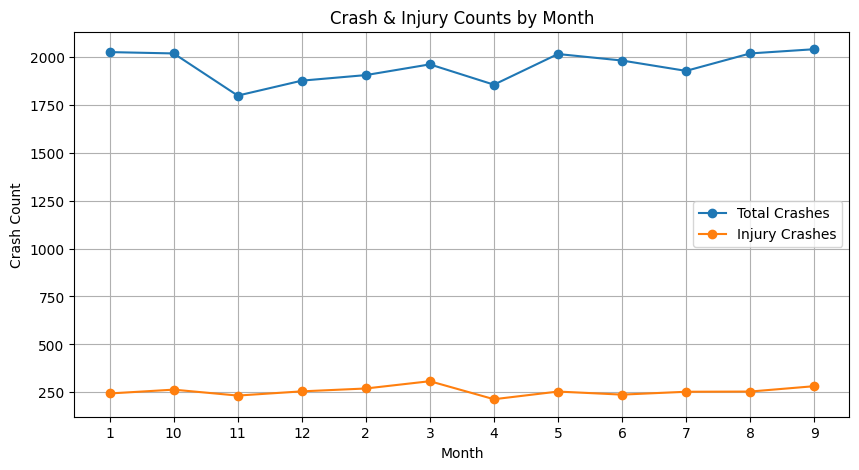

In [47]:
import matplotlib.pyplot as plt

# Count crashes by month, injury and non-injury
month_injury = crash_df.groupby('Month')['injury_severity_bin'].sum()
month_total = crash_df.groupby('Month')['injury_severity_bin'].count()

plt.figure(figsize=(10,5))
plt.plot(month_total.index, month_total.values, '-o', label='Total Crashes')
plt.plot(month_injury.index, month_injury.values, '-o', label='Injury Crashes')
plt.xlabel('Month')
plt.ylabel('Crash Count')
plt.title('Crash & Injury Counts by Month')
plt.legend()
plt.grid(True)
plt.show()


In [48]:
from sklearn.cluster import DBSCAN
import numpy as np

# Keep records with valid coordinates
locs = crash_df.dropna(subset=['lat', 'lon'])[['lat', 'lon']].values

# DBSCAN clustering
dbscan = DBSCAN(eps=0.01, min_samples=15).fit(locs)  # eps ~1km; tune for your locale size

crash_df['hotspot'] = -1
crash_df.loc[crash_df.dropna(subset=['lat','lon']).index, 'hotspot'] = dbscan.labels_

# Count clusters
hotspot_counts = crash_df['hotspot'].value_counts()
print(hotspot_counts)


hotspot
-1    13129
 0    10027
 2       88
 4       60
 3       36
 5       29
 1       19
 6       16
 7       15
Name: count, dtype: int64


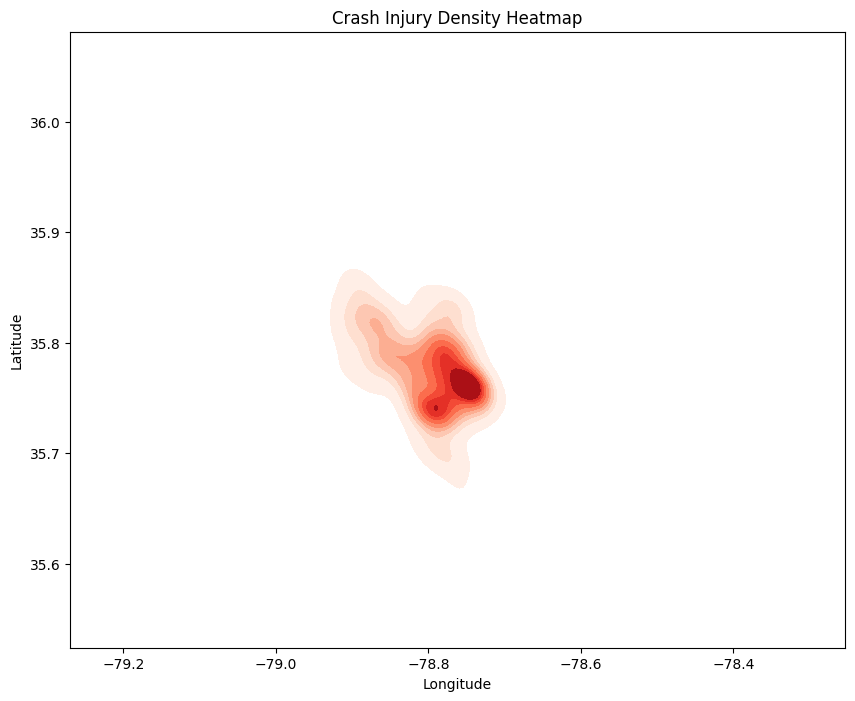

In [49]:
import seaborn as sns

plt.figure(figsize=(10,8))
sns.kdeplot(
    data=crash_df.dropna(subset=['lat','lon']),
    x='lon', y='lat', 
    weights='injury_severity_bin',
    cmap='Reds', fill=True, thresh=0.05
)
plt.title('Crash Injury Density Heatmap')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [52]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import ast

# Load bike routes (make sure correct path)
bike_df = pd.read_excel(r"C:\Users\hp\OneDrive\Desktop\data\Cary\Cary_data_downloaded\bike-routes.xlsx")

# Plot
plt.figure(figsize=(10,8))

# Plot bike routes from Geo Shape column
for geo in bike_df['Geo Shape']:
    try:
        obj = ast.literal_eval(str(geo))
        if obj['type'] == 'LineString':
            coords = obj['coordinates']
            lons = [pt[0] for pt in coords]
            lats = [pt[1] for pt in coords]
            plt.plot(lons, lats, color='deepskyblue', linewidth=1, alpha=0.6)
    except Exception:
        continue

# Plot finer hexbins: gridsize=80 or 100 for detail
valid_points = crash_df.dropna(subset=['lat', 'lon'])
plt.hexbin(
    valid_points['lon'], valid_points['lat'],
    C=valid_points['injury_severity_bin'],
    gridsize=80,                   # Finer hexbin!
    cmap='Reds', reduce_C_function=np.sum, bins='log'
)

plt.axis('off')
plt.savefig('hexbin_bikeroutes.png', bbox_inches='tight', pad_inches=0, transparent=True)
plt.close()



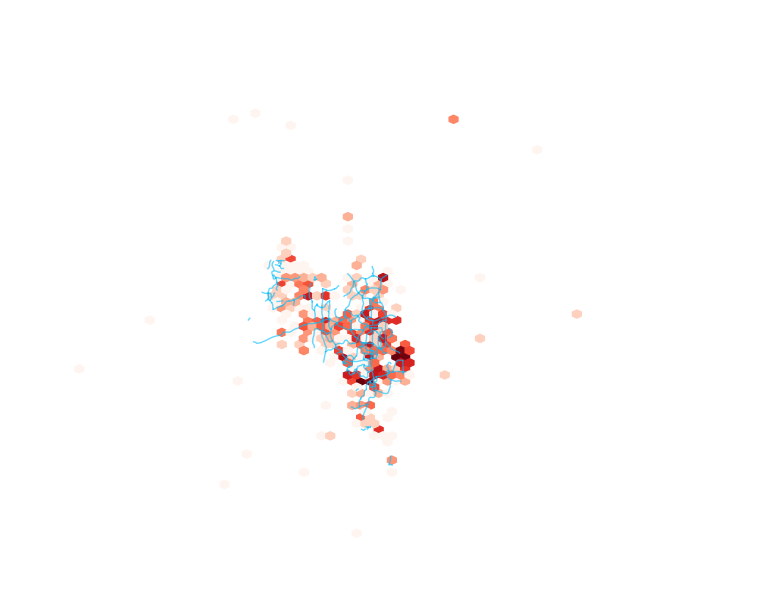

In [53]:
import folium

bounds = [[valid_points['lat'].min(), valid_points['lon'].min()],
          [valid_points['lat'].max(), valid_points['lon'].max()]]

m = folium.Map(location=[35.78, -78.8], zoom_start=12)
folium.raster_layers.ImageOverlay(
    image='hexbin_bikeroutes.png',
    bounds=bounds,
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    zindex=1
).add_to(m)

m


# Cary Bike Analysis: Public Report Draft

##  Summary

This analysis examines bicycle safety and infrastructure in Cary, North Carolina, to identify areas of concern and provide recommendations for improving cyclist safety. The study integrates multiple datasets including bike routes, crash data, parks and recreation areas, eco-counter traffic monitoring sites, and points of interest to create a comprehensive picture of cycling conditions in Cary.

---

## Project Overview

The Cary Bike Analysis project aims to:
- Map and analyze the existing bicycle infrastructure network
- Identify high-risk areas where bike crashes occur
- Assess the relationship between route characteristics and safety outcomes
- Support city planning efforts to enhance cyclist safety and promote active transportation

---

## Key Datasets Used

### 1. Bike Routes Dataset
**Source:** Town of Cary Open Data Portal  
**Records:** 250 bike route segments  
**Key Information:**
- Route types (Neighborhood Routes, etc.)
- Facility types (Striped Bike Lanes, Signed Routes, etc.)
- Status (Existing, Planned)
- Speed limits
- Geographic coordinates for mapping

### 2. Crash Data
**Source:** North Carolina Department of Transportation  
**Key Information:**
- Location coordinates of bicycle-involved crashes
- Injury severity classifications
- Temporal patterns (date/time)
- Environmental conditions

### 3. Parks and Recreation Areas
**Source:** Town of Cary  
**Records:** 867 park locations  
**Purpose:** Understanding proximity of recreational areas to bike routes and crash locations

### 4. Eco-Counter Sites
**Source:** Capital Area Metropolitan Planning Organization  
**Records:** 40 monitoring locations  
**Purpose:** Tracking bicycle and pedestrian traffic volumes to understand usage patterns

### 5. Points of Interest
**Source:** Town of Cary  
**Records:** 70 facilities (schools, community centers, etc.)  
**Purpose:** Understanding destinations and high-traffic generators

---

## Major Visualizations

### Interactive Safety Score Map
The analysis features an **interactive color-coded map** showing all 250 bike route segments, where:
- **Green routes** indicate safer conditions (higher safety scores)
- **Yellow/orange routes** indicate moderate concern areas
- **Red routes** indicate higher-risk areas requiring attention

Each segment is scored based on multiple factors including:
- Speed limits on adjacent roads
- Type of bicycle facility (protected lanes vs. shared roadways)
- Proximity to crash locations
- Route status and characteristics

The map also displays:
- **Green markers:** Parks and recreation areas
- **Purple markers:** Eco-counter monitoring sites
- **Blue markers:** Points of interest (schools, community facilities)

### Crash Density Heatmap
A **hexagonal binning visualization** overlays crash data on the bike route network, revealing:
- Geographic clusters of bicycle crashes
- Areas where crashes result in more severe injuries
- Spatial patterns that may indicate infrastructure deficiencies
- Hot spots requiring immediate safety interventions

This heatmap uses a logarithmic color scale to highlight areas with disproportionately high crash concentrations.

---

## Main Findings and Recommendations

### Key Findings

1. **Infrastructure Variability**
   - Bike routes include various facility types with differing safety levels
   - Many routes are on roadways with speed limits of 25-30+ mph
   - Not all routes have dedicated bicycle infrastructure (some are signed-only neighborhood routes)

2. **Crash Concentration Areas**
   - Crashes are not uniformly distributed across the network
   - Specific corridor segments show elevated crash density
   - Severity patterns suggest certain route characteristics correlate with more serious injuries

3. **Network Coverage**
   - 250 route segments provide foundational connectivity
   - Parks, schools, and other destinations are well-distributed but may lack safe access routes
   - Some high-traffic areas (near eco-counter sites) require enhanced safety measures

### Safety Recommendations

#### Immediate Actions (High Priority)
1. **Target High-Risk Segments**
   - Focus safety improvements on red-scored route segments
   - Conduct field assessments of crash hot spots identified in the heatmap
   - Implement quick-build safety interventions (signage, pavement markings, speed reduction)

2. **Enhance School Zone Connectivity**
   - Prioritize safe routes to schools (identified as Points of Interest)
   - Consider protected bike lanes or traffic calming near educational facilities
   - Engage school communities in safe cycling education

#### Medium-Term Improvements
3. **Upgrade Facility Types**
   - Convert signed-only routes to striped or protected facilities where feasible
   - Add physical separation on routes adjacent to high-speed roadways (35+ mph)
   - Fill network gaps to create continuous protected corridors

4. **Traffic Calming**
   - Reduce speed limits on high-crash corridors
   - Implement traffic calming measures (speed humps, chicanes, raised crossings)
   - Enhance visibility at intersections through design improvements

5. **Data-Driven Monitoring**
   - Expand eco-counter network to gather more comprehensive usage data
   - Establish before/after evaluation protocols for safety interventions
   - Regularly update crash analysis to track progress

#### Long-Term Vision
6. **Complete Network Development**
   - Build out planned routes to expand network coverage
   - Create protected corridor connections between major destinations
   - Integrate bike infrastructure with transit and greenway systems

7. **Vision Zero Approach**
   - Adopt a Vision Zero policy to eliminate fatal and severe-injury crashes
   - Invest in proven safety countermeasures
   - Prioritize equity in safety improvements across all neighborhoods

---

## Data-Driven Insights

### Route Risk Assessment
By combining crash data with route characteristics, the analysis created a **normalized safety scoring system (0-10 scale)** that considers:
- Historical crash frequency near each segment
- Injury severity of crashes
- Road speed environment
- Type of bicycle facility present

This quantitative approach enables objective prioritization of safety investments.

### Spatial Patterns
The geographic analysis reveals:
- **Crash clustering** suggests systemic issues (not random occurrence)
- **Corridor-level patterns** indicate that certain streets require comprehensive redesign
- **Proximity analysis** shows relationships between destinations, usage, and crash risk

### Evidence-Based Planning
This analysis provides the foundation for:
- Grant applications for bicycle infrastructure funding
- Justification for safety improvement projects
- Community engagement around prioritized locations
- Performance measurement and accountability

---

## Next Steps for Community Action

### For City Officials and Planners
- Review high-priority segments for near-term safety interventions
- Incorporate findings into Capital Improvement Program planning
- Allocate resources to address identified hot spots
- Establish performance metrics to track safety improvements

### For Cyclists and Residents
- Stay informed about planned safety improvements
- Report safety concerns and near-miss incidents
- Participate in public engagement on bicycle infrastructure projects
- Practice safe cycling behaviors and encourage others to do the same

### For Advocacy Groups
- Use this data to support safety improvement campaigns
- Engage with city officials on prioritizing high-risk corridors
- Promote Vision Zero principles in local policy
- Organize community rides to raise awareness of infrastructure needs

---

## Conclusion

This comprehensive analysis demonstrates that data-driven approaches can effectively identify safety concerns and guide infrastructure investments. By combining crash data, route characteristics, and spatial analysis, Cary can strategically improve bicycle safety and work toward a transportation network that welcomes cyclists of all ages and abilities.

**My opinion:** prioritize high-risk segments, invest in proven safety countermeasures, and commit to continuous improvement through ongoing monitoring and evaluation.

---
